# Rhus.succedanea.L. Population Prediction

We will predict the population density of Rhus.succedanea.L., which is an invasive species in Taiwan. To predict population density, we will count how many were observed at each sampling location. Then using the k-nearest neighbors algorithm we will find the distance and count of each neighboring Rhus.succedanea.L. observation, as well as the distance to nearest roads.

In [1]:
#For mapping and getting k-lag data
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, MultiPoint , LineString
from shapely.ops import nearest_points
from sklearn.neighbors import BallTree
import matplotlib.pyplot as plt
import folium
from folium import plugins
gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'
import branca
import branca.colormap as cm

In [2]:
import random
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn.model_selection import RepeatedKFold
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions
tfb = tfp.bijectors
tfg = tfp.glm
import tensorflow.keras.backend as kb
from keras.callbacks import EarlyStopping

In [3]:
def create_geo(df, x='Longitude', y='Latitude'):
    return gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[x], df[y]), crs={'init':'EPSG:4326'}) #creates a geometry 

In [4]:
def get_nearest(n_points, candidates, k_neighbors=1):
   
    # Nearest neighbors between points
    tree = BallTree(candidates, leaf_size=15, metric='haversine') #balltree algorthim for finding points
    distances, indices = tree.query(n_points, k=k_neighbors) #gets point and distance

    #Transpose and get indices
    distances = distances.transpose() 
    indices = indices.transpose()
    closest = indices[0]
    closest_dist = distances[0]

    return (closest, closest_dist) 

In [5]:
def nearest_neighbor(left_gdf, right_gdf, return_dist=False):

    left_geom_col = left_gdf.geometry.name #Main points of interest
    right_geom_col = right_gdf.geometry.name #Points nearby 

    right = right_gdf.copy().reset_index(drop=True) #get right index sequentialy

    #Need to get all points and convert to radians
    left_radians = np.array(left_gdf[left_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())
    right_radians = np.array(right[right_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())

    closest, dist = get_nearest(n_points=left_radians, candidates=right_radians) # points closest
    closest_points = right.loc[closest] #returns nearest points

    closest_points = closest_points.reset_index(drop=True) #get left index sequentialy

    #get distance
    if return_dist:
        earth_radius = 6371000  # meters
        closest_points['distance'] = dist * earth_radius #radians to meters

    return closest_points

In [6]:
#Read in data
fc = pd.read_csv('C:/Users/cjon377/Desktop/Research/tranfer_learning/Forest_data/Forest_Counts.csv',encoding = "ISO-8859-1")
fc

,Unnamed: 0,Long_Lat,Abelia.chinensis.R..Br..var..ionandra..Hayata..Masam.,Abies.kawakamii..Hayata..Ito,Abutilon.indicum..L...Sweet,Acacia.caesia..L...Willd.,Acacia.confusa.Merr.,Acalypha.akoensis.Hayata,Acalypha.matudai.Hayata,Acalypha.suirenbiensis.Yamamoto,...,X49,X50,X51,X52,X53,X54,X55,X56,X57,X58
0,1,"120.259354749687,22.655581577308",0,0,0,0,0,0,0,0,...,31.081445,31.744907,31.326139,31.005436,29.400914,26.922000,24.235387,11.166350,19.355868,18.926367
1,2,"120.259489649762,22.6667078837363",0,0,0,0,0,0,0,0,...,31.072041,31.734288,31.317065,30.995454,29.390342,26.900641,24.202743,11.171612,19.434811,18.967684
2,3,"120.25967073623,22.6583463984591",0,0,0,0,0,0,0,0,...,31.078620,31.741719,31.323415,31.002436,29.397738,26.915586,24.225584,11.167924,19.379466,18.938726
3,4,"120.259978942297,22.649859062465",0,0,0,0,1,0,0,0,...,31.080492,31.747399,31.328104,31.006940,29.402635,26.928796,24.246396,11.161804,19.284710,18.883594
4,5,"120.261032907815,22.6583526860838",0,0,0,0,0,0,0,0,...,31.092757,31.751605,31.329082,31.013431,29.414262,26.938229,24.256674,11.161168,19.420070,18.946404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,2896,"121.908068880291,24.960823880146",0,0,0,0,2,0,0,0,...,29.134070,31.226040,30.915290,28.709380,25.401140,22.506980,19.563270,12.474690,8.144077,18.504250
2896,2897,"121.945796238284,24.9876719070153",1,0,0,0,0,0,0,0,...,28.560880,30.768180,30.467350,27.893690,24.260550,21.357700,18.403040,12.830160,6.678566,17.869000
2897,2898,"121.948852718017,24.9871288482314",0,0,0,0,0,0,0,0,...,28.679650,30.879740,30.577060,28.085780,24.519990,21.607070,18.655470,12.772990,7.124511,18.682120
2898,2899,"121.951722687099,24.988094527955",0,0,0,0,0,0,0,0,...,28.931450,31.082970,30.781190,28.541510,25.183460,22.253140,19.315230,12.558710,8.697831,20.926810


In [7]:
fc=fc.iloc[:,1:] # Remove index values from file

df = pd.DataFrame(fc['Long_Lat'].str.split(',', expand=True)) #Split Long_Lat into two collumns
df=df.rename(columns={0: "Longitude", 1: "Latitude"}) 
df_g=create_geo(df) #Create a geometry shape for long and lat

fc['Longitude']=df_g['Longitude']
fc['Latitude']=df_g['Latitude']
fc['geometry']=df_g['geometry']


C:\Users\cjon377\Anaconda3\envs\tf\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [8]:
df_g #Our locations

,Longitude,Latitude,geometry
0,120.259354749687,22.655581577308,POINT (120.25935 22.65558)
1,120.259489649762,22.6667078837363,POINT (120.25949 22.66671)
2,120.25967073623,22.6583463984591,POINT (120.25967 22.65835)
3,120.259978942297,22.649859062465,POINT (120.25998 22.64986)
4,120.261032907815,22.6583526860838,POINT (120.26103 22.65835)
...,...,...,...
2895,121.908068880291,24.960823880146,POINT (121.90807 24.96082)
2896,121.945796238284,24.9876719070153,POINT (121.94580 24.98767)
2897,121.948852718017,24.9871288482314,POINT (121.94885 24.98713)
2898,121.951722687099,24.988094527955,POINT (121.95172 24.98809)


In [9]:
x_dist=np.array(fc['geometry'].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list()) #Get distances
tree = BallTree(x_dist, leaf_size=10, metric='haversine')  
dist, ind = tree.query(x_dist, k=10) #knn

In [10]:
print(ind[:,1])
print(dist[:,1:4]* 6371000)

[   2    2    4 ... 2898 2897 2898]
[[ 158.85584731  242.75802751  328.07729411]
 [ 468.95302632  498.63595406  623.6197066 ]
 [ 151.46697924  158.85584731  468.95302632]
 ...
 [ 324.1454281   341.36372627 1016.90911839]
 [ 324.1454281   659.4600522   698.91444112]
 [ 698.91444112 1016.90911839 1356.76551009]]


In [11]:
lag_1=fc.iloc[ind[:,1]] #first lag data
lag_1

,Long_Lat,Abelia.chinensis.R..Br..var..ionandra..Hayata..Masam.,Abies.kawakamii..Hayata..Ito,Abutilon.indicum..L...Sweet,Acacia.caesia..L...Willd.,Acacia.confusa.Merr.,Acalypha.akoensis.Hayata,Acalypha.matudai.Hayata,Acalypha.suirenbiensis.Yamamoto,Acampe.rigida..Buch..Ham.ex.J..E..Sm...Hunt,...,X52,X53,X54,X55,X56,X57,X58,Longitude,Latitude,geometry
2,"120.25967073623,22.6583463984591",0,0,0,0,0,0,0,0,0,...,31.002436,29.397738,26.915586,24.225584,11.167924,19.379466,18.938726,120.25967073623,22.6583463984591,POINT (120.25967 22.65835)
2,"120.25967073623,22.6583463984591",0,0,0,0,0,0,0,0,0,...,31.002436,29.397738,26.915586,24.225584,11.167924,19.379466,18.938726,120.25967073623,22.6583463984591,POINT (120.25967 22.65835)
4,"120.261032907815,22.6583526860838",0,0,0,0,0,0,0,0,0,...,31.013431,29.414262,26.938229,24.256674,11.161168,19.420070,18.946404,120.261032907815,22.6583526860838,POINT (120.26103 22.65835)
5,"120.26225777798,22.65127834133",0,0,0,0,0,0,0,0,0,...,31.032917,29.439373,26.977495,24.313526,11.151750,19.407066,18.928224,120.26225777798,22.65127834133,POINT (120.26226 22.65128)
2,"120.25967073623,22.6583463984591",0,0,0,0,0,0,0,0,0,...,31.002436,29.397738,26.915586,24.225584,11.167924,19.379466,18.938726,120.25967073623,22.6583463984591,POINT (120.25967 22.65835)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2894,"121.899681885615,24.9663816845006",0,0,0,0,3,0,0,0,0,...,27.393780,23.849050,21.003200,18.080070,12.516950,6.437266,15.280380,121.899681885615,24.9663816845006,POINT (121.89968 24.96638)
2897,"121.948852718017,24.9871288482314",0,0,0,0,0,0,0,0,0,...,28.085780,24.519990,21.607070,18.655470,12.772990,7.124511,18.682120,121.948852718017,24.9871288482314,POINT (121.94885 24.98713)
2898,"121.951722687099,24.988094527955",0,0,0,0,0,0,0,0,0,...,28.541510,25.183460,22.253140,19.315230,12.558710,8.697831,20.926810,121.951722687099,24.988094527955,POINT (121.95172 24.98809)
2897,"121.948852718017,24.9871288482314",0,0,0,0,0,0,0,0,0,...,28.085780,24.519990,21.607070,18.655470,12.772990,7.124511,18.682120,121.948852718017,24.9871288482314,POINT (121.94885 24.98713)


[]

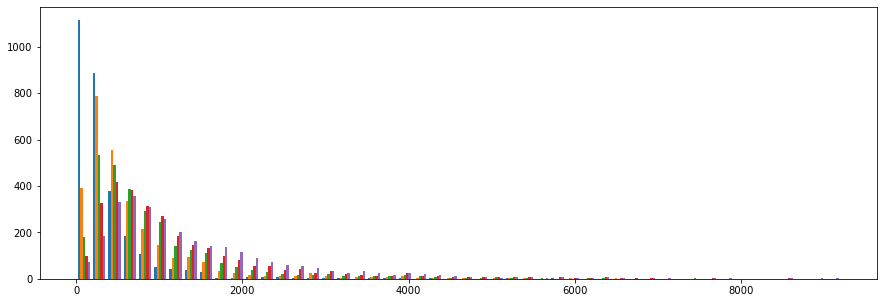

In [12]:
#Look at the distribtion of the first k=10 neighbor distances 
plt.figure(figsize=(15, 5))
plt.hist(dist[:,1:6]* 6371000,bins=50)
plt.plot()
#notice the distribution

In [13]:
#If we and to use all the laged points (change length for all)
k_lags=[]
for k in range(1,3):
    
    k_lag=fc.loc[ind[:,k]]
    k_lag=k_lag.iloc[:,1:2546]
    k_lag=np.array(k_lag,dtype='float64')
    k_lags.append(k_lag)
    #np.append(k_lag, k_lag, 1).shape
    
all_lags=np.concatenate(k_lags,1)

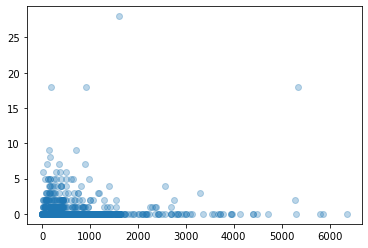

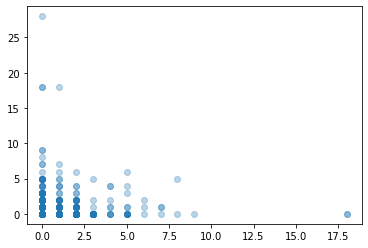

In [14]:
#First lag of Rhus.succedanea.L.
lag=np.array(lag_1.iloc[:,1997],dtype='float64')
lag
X=np.array(dist[:,1]* 6371000)
X2=np.array(dist[:,2]* 6371000)
y=np.array(fc.iloc[:,1997],dtype='float64')

#Look at distance and count
plt.scatter(X,y,alpha=.3)
plt.show()

#Look at lagged count on count
plt.scatter(lag,y,alpha=.3)
plt.show()

In [15]:
#Get all roads shapefile
roads=gpd.read_file("C:/Users/cjon377/Desktop/Research/tranfer_learning/Factors/Road_longlat.shp")
roads=roads['geometry']
roads

0         LINESTRING (120.36273 22.67994, 120.36290 22.6...
1         LINESTRING (120.27142 22.73070, 120.27148 22.7...
2         LINESTRING (120.21639 22.90204, 120.21723 22.9...
3         LINESTRING (120.23543 22.90317, 120.23554 22.9...
4         LINESTRING (120.29901 22.79288, 120.29988 22.7...
                                ...                        
613853    LINESTRING (121.76694 24.79655, 121.76668 24.7...
613854    LINESTRING (121.78211 24.83240, 121.78186 24.8...
613855    LINESTRING (121.73924 24.78713, 121.74001 24.7...
613856    LINESTRING (121.74046 24.78609, 121.74143 24.7...
613857    LINESTRING (121.74325 24.78512, 121.74323 24.7...
Name: geometry, Length: 613858, dtype: geometry

In [16]:
#Need to pull each point out of linestrings
def coord_lister(geom):
    coords = list(geom.coords)
    return (coords)

coordinates = roads.geometry.apply(coord_lister)

In [17]:
#Need to flatten the list of arrays and put into data frame
coord=[c for c in coordinates]
c_df = []
for k in range(len(coord)):
    for j in range(len(coord[k])):
        c_df.append(coord[k][j])
    
c_df=pd.DataFrame(c_df) 

In [18]:
c_df.rename(columns={0: 'Longitude', 1: 'Latitude'}, inplace=True)
c_df #cleaned data

,Longitude,Latitude
0,120.362733,22.679937
1,120.362900,22.679594
2,120.271421,22.730695
3,120.271479,22.730751
4,120.216395,22.902044
...,...,...
3705219,121.740009,24.787843
3705220,121.740455,24.786086
3705221,121.741428,24.787042
3705222,121.743251,24.785118


In [19]:
c_df=create_geo(c_df) #Convert into a new geometry

C:\Users\cjon377\Anaconda3\envs\tf\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [20]:
#Finally we find the nearest point to each road
closest_roads = nearest_neighbor(df_g,c_df, return_dist=True)
closest_roads

,Longitude,Latitude,geometry,distance
0,120.258822,22.653717,POINT (120.25882 22.65372),120.076415
1,120.259377,22.667842,POINT (120.25938 22.66784),64.777780
2,120.258822,22.653717,POINT (120.25882 22.65372),276.009960
3,120.259766,22.650422,POINT (120.25977 22.65042),39.415416
4,120.258881,22.653650,POINT (120.25888 22.65365),355.904855
...,...,...,...,...
2895,121.908291,24.953184,POINT (121.90829 24.95318),449.702810
2896,121.946880,24.979260,POINT (121.94688 24.97926),509.372786
2897,121.949495,24.980760,POINT (121.94950 24.98076),381.477129
2898,121.953054,24.982267,POINT (121.95305 24.98227),373.516822


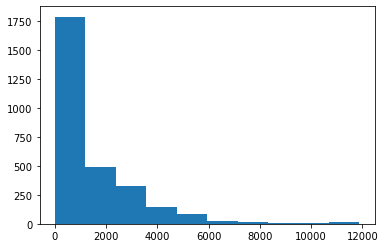

In [21]:
#Look at counts and distance to roads
plt.hist(closest_roads['distance'])
plt.show()

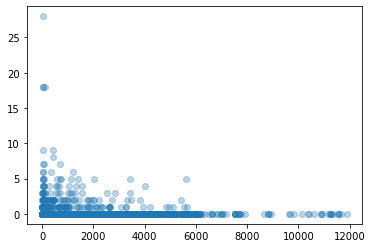

In [22]:
#Look at distance and count
plt.scatter(closest_roads['distance'],y,alpha=.3)
plt.show()

In [23]:
closest_roads = closest_roads.rename(columns={'geometry': 'closest_roads_geom'})
closest_roads 

#Join with plant point locations
df_g=df_g.join(closest_roads,  how='left', lsuffix=['Longitude','Latitude'], rsuffix = ['Longitude','Latitude']) 

In [24]:
df_g

,"Longitude['Longitude', 'Latitude']","Latitude['Longitude', 'Latitude']",geometry,"Longitude['Longitude', 'Latitude']","Latitude['Longitude', 'Latitude']",closest_roads_geom,distance
0,120.259354749687,22.655581577308,POINT (120.25935 22.65558),120.258822,22.653717,POINT (120.25882 22.65372),120.076415
1,120.259489649762,22.6667078837363,POINT (120.25949 22.66671),120.259377,22.667842,POINT (120.25938 22.66784),64.777780
2,120.25967073623,22.6583463984591,POINT (120.25967 22.65835),120.258822,22.653717,POINT (120.25882 22.65372),276.009960
3,120.259978942297,22.649859062465,POINT (120.25998 22.64986),120.259766,22.650422,POINT (120.25977 22.65042),39.415416
4,120.261032907815,22.6583526860838,POINT (120.26103 22.65835),120.258881,22.653650,POINT (120.25888 22.65365),355.904855
...,...,...,...,...,...,...,...
2895,121.908068880291,24.960823880146,POINT (121.90807 24.96082),121.908291,24.953184,POINT (121.90829 24.95318),449.702810
2896,121.945796238284,24.9876719070153,POINT (121.94580 24.98767),121.946880,24.979260,POINT (121.94688 24.97926),509.372786
2897,121.948852718017,24.9871288482314,POINT (121.94885 24.98713),121.949495,24.980760,POINT (121.94950 24.98076),381.477129
2898,121.951722687099,24.988094527955,POINT (121.95172 24.98809),121.953054,24.982267,POINT (121.95305 24.98227),373.516822


In [25]:
# Now we can create a linestring to show graphically how close each point is to each road
df_g['line'] = df_g.apply(lambda row: LineString([row['geometry'], row['closest_roads_geom']]), axis=1)
line_gdf = df_g[['closest_roads_geom', 'line']].set_geometry('line') #creates line
line_gdf.crs = crs={"init":"epsg:4326"} #make sure the coordinate reference systems still matches

C:\Users\cjon377\Anaconda3\envs\tf\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [26]:
#Create map
mp1 = folium.Map([24.62179, 121.391991], tiles='CartoDb dark_matter')

locs = zip(fc.Latitude, fc.Longitude)
locsr = zip(closest_roads.Latitude, closest_roads.Longitude)

for location in locs:
    folium.CircleMarker(location=location, 
        color='green',   radius=4).add_to(mp1)

    
for location in locsr:
    folium.CircleMarker(location=location, 
              color='red', radius=2).add_to(mp1)

folium.GeoJson(data=line_gdf['line']).add_to(mp1)

mp1.save('map1.html')

mp1

In [27]:
#Split data for training, validation, and testing
X_train, X_test, y_train, y_test = train_test_split(np.stack((stats.zscore(X),stats.zscore(lag),stats.zscore(closest_roads.iloc[:,3])),axis=1), fc.iloc[:,1997], test_size=0.3, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.4, random_state=1)


In [28]:
#If we want to include enviromental variables
#Split for training and testing
#The size of the training and testing set is spatial dependent, meaning the amount of rows increases/decreases 
#the area and will effect the total pop

'''
env=fc.iloc[:,2488:2546]
data=np.stack((X,X2,closest_roads.iloc[:,3],
               env['X1'],env['X2'], env['X3'], env['X4'],env['X5'], env['X6'], env['X7'],env['X8'],env['X9'],env['X10'],
               env['X11'],env['X12'], env['X13'],env[ 'X14'],env[ 'X15'], env['X16'], env['X17'],env['X18'], env['X19'],
               env['X20'],env['X21'],env['X22'],env['X23'],env['X24'],env['X25'],env['X26'],env['X27'],env['X28'], 
               env['X29'],env['X30'],env['X31'],env['X32'], env['X33'],env['X34'],env['X35'],env['X36'],env['X37'],
               env['X38'],env['X39'],env['X40'],env['X41'], env['X42'], env['X43'],env['X44'],env['X45'],env['X46'],
               env['X47'],env['X48'], env['X49'], env['X50'], env['X51'], env['X52'], env['X53'], env['X54'], env['X55'],
               env['X56'],env['X57'], env['X58']),axis=1)

'''

"\nenv=fc.iloc[:,2488:2546]\ndata=np.stack((X,X2,closest_roads.iloc[:,3],\n               env['X1'],env['X2'], env['X3'], env['X4'],env['X5'], env['X6'], env['X7'],env['X8'],env['X9'],env['X10'],\n               env['X11'],env['X12'], env['X13'],env[ 'X14'],env[ 'X15'], env['X16'], env['X17'],env['X18'], env['X19'],\n               env['X20'],env['X21'],env['X22'],env['X23'],env['X24'],env['X25'],env['X26'],env['X27'],env['X28'], \n               env['X29'],env['X30'],env['X31'],env['X32'], env['X33'],env['X34'],env['X35'],env['X36'],env['X37'],\n               env['X38'],env['X39'],env['X40'],env['X41'], env['X42'], env['X43'],env['X44'],env['X45'],env['X46'],\n               env['X47'],env['X48'], env['X49'], env['X50'], env['X51'], env['X52'], env['X53'], env['X54'], env['X55'],\n               env['X56'],env['X57'], env['X58']),axis=1)\n\n"

# Neural Network Model

Part 1: We will construct a family of models. Each model will use k-fold cross validation for training. We will stop training when the model does not improve. Each model will construct a probability distribution of counts which are zero inflated. We will use a probabilistic deep learning framework, where the output layer can either be a Negative Binomial or Zero-inflated Poisson model. We will use a Zero-inflated Poisson for now (Negative Binomial coming at a later date). We will then take each sum of the counts from each model output and average them for each model. It is shown that the average prediction is extremely close to the sum of the counts of testing set.   

In [29]:
def zero_inf(out): 
    rate = tf.squeeze(tf.math.exp(out[:,0:1])) #gets lambda and flattends tensor
    s = tf.math.sigmoid(out[:,1:2]) #zero-infaltion with sigmoid (0,1)
    probs = tf.concat([1-s, s], axis=1) #C get probs of 0 and poisson 
    #get mixture of models
    return tfd.Mixture(
          cat=tfd.Categorical(probs=probs),
          components=[
          tfd.Deterministic(loc=tf.zeros_like(rate)), #zero-inflation model
          tfd.Poisson(rate=rate, force_probs_to_zero_outside_support=True), #poisson model
        ])

def zero_inflated(n_inputs,n_outputs,layer1_size):

    inputs = tf.keras.layers.Input(shape=(n_inputs,)) 
    x = tf.keras.layers.Dense(layer1_size, kernel_initializer='Zeros', activation="relu")(inputs) 
    x = tf.keras.layers.Dense(1000, kernel_initializer='Zeros', activation="relu")(x) 
    x = tf.keras.layers.Dense(1000,  kernel_initializer='Zeros',activation="relu")(x) 

    outputs = tf.keras.layers.Dense(2)(x)
    zi = tfp.layers.DistributionLambda(zero_inf)(outputs) #output to zip model
    model_zi= tf.keras.Model(inputs=inputs, outputs=zi)
    model_zi.compile(loss='Poisson', optimizer='adam',
                    metrics=[tf.keras.metrics.AUC(from_logits=True)]) #using poisson as a loss function
    
    return model_zi


In [30]:
# k-fold cross-validation
def evaluate_model(X, y,layer1_size,X_val,y_val,x_shape, y_shape):
    results = list()
    n_inputs, n_outputs = x_shape, y_shape
    cv = RepeatedKFold(n_splits=2, n_repeats=20, random_state=1) #cross validate
    models = []
    index = 0
    for train_ix, test_ix in cv.split(X):
      
        X_train, X_test = X[train_ix], X[test_ix] 
        y_train, y_test = y[train_ix], y[test_ix]
       
        model = zero_inflated(n_inputs =  n_inputs, n_outputs =n_outputs ,layer1_size = layer1_size) #get model
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1,patience=2)
        model.fit(x=X_train, y=y_train, epochs=10, verbose=1, validation_data=(X_val, y_val),callbacks=[es]) #model fit
   
        index +=1
        print('Model:',index)

        models.append(model) #get family of models
    return models


In [31]:
model = zero_inflated(n_inputs =  61, n_outputs =1 ,layer1_size = 30)
model.summary()

Instructions for updating:
The `interpolate_nondiscrete` flag is deprecated; instead use `force_probs_to_zero_outside_support` (with the opposite sense).
Instructions for updating:
The `interpolate_nondiscrete` property is deprecated; instead use `force_probs_to_zero_outside_support` (with the opposite sense).
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 61)]              0         
                                                                 
 dense (Dense)               (None, 30)                1860      
                                                                 
 dense_1 (Dense)             (None, 1000)              31000     
                                                                 
 dense_2 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_3 (Den

In [32]:
models=evaluate_model(X=X_train, y=np.array(y_train,dtype='float64'),layer1_size=30,
                      X_val=X_val,y_val=np.array(y_val,dtype='float64'), x_shape=3, y_shape=1)

Epoch 1/10
20/20 [==============================] - 3s 66ms/step - loss: 2.0017 - auc_1: 0.5178 - val_loss: 2.8755 - val_auc_1: 0.5026
Epoch 2/10
20/20 [==============================] - 0s 18ms/step - loss: 2.0991 - auc_1: 0.5240 - val_loss: 2.5609 - val_auc_1: 0.4979
Epoch 3/10
20/20 [==============================] - 0s 18ms/step - loss: 2.1808 - auc_1: 0.5497 - val_loss: 2.8625 - val_auc_1: 0.5021
Epoch 4/10
20/20 [==============================] - 0s 18ms/step - loss: 2.6798 - auc_1: 0.4747 - val_loss: 2.6289 - val_auc_1: 0.5060
Epoch 00004: early stopping
Model: 1
Epoch 1/10
20/20 [==============================] - 2s 54ms/step - loss: 2.2963 - auc_2: 0.5412 - val_loss: 2.6649 - val_auc_2: 0.4911
Epoch 2/10
20/20 [==============================] - 0s 18ms/step - loss: 1.7712 - auc_2: 0.5440 - val_loss: 1.9857 - val_auc_2: 0.5480
Epoch 3/10
20/20 [==============================] - 0s 17ms/step - loss: 2.6356 - auc_2: 0.5011 - val_loss: 3.1658 - val_auc_2: 0.4495
Epoch 4/10
20/20 [

20/20 [==============================] - 0s 19ms/step - loss: 2.5245 - auc_13: 0.4842 - val_loss: 2.8677 - val_auc_13: 0.5109
Epoch 8/10
20/20 [==============================] - 0s 20ms/step - loss: 2.5550 - auc_13: 0.5097 - val_loss: 2.7472 - val_auc_13: 0.5113
Epoch 00008: early stopping
Model: 13
Epoch 1/10
20/20 [==============================] - 2s 53ms/step - loss: 1.8268 - auc_14: 0.5431 - val_loss: 3.0824 - val_auc_14: 0.5050
Epoch 2/10
20/20 [==============================] - 0s 17ms/step - loss: 1.9747 - auc_14: 0.5306 - val_loss: 2.7965 - val_auc_14: 0.4719
Epoch 3/10
20/20 [==============================] - 0s 17ms/step - loss: 2.2397 - auc_14: 0.5323 - val_loss: 2.8553 - val_auc_14: 0.5162
Epoch 4/10
20/20 [==============================] - 0s 17ms/step - loss: 2.7390 - auc_14: 0.4198 - val_loss: 2.7613 - val_auc_14: 0.5113
Epoch 5/10
20/20 [==============================] - 0s 17ms/step - loss: 2.1608 - auc_14: 0.5307 - val_loss: 2.7310 - val_auc_14: 0.4521
Epoch 6/10
20/

20/20 [==============================] - 0s 17ms/step - loss: 1.8013 - auc_24: 0.5827 - val_loss: 2.9628 - val_auc_24: 0.5231
Epoch 5/10
20/20 [==============================] - 0s 18ms/step - loss: 2.6920 - auc_24: 0.4681 - val_loss: 2.8033 - val_auc_24: 0.4953
Epoch 00005: early stopping
Model: 24
Epoch 1/10
20/20 [==============================] - 3s 52ms/step - loss: 2.2522 - auc_25: 0.4841 - val_loss: 3.1531 - val_auc_25: 0.4630
Epoch 2/10
20/20 [==============================] - 0s 17ms/step - loss: 2.2011 - auc_25: 0.4506 - val_loss: 2.0767 - val_auc_25: 0.5441
Epoch 3/10
20/20 [==============================] - 0s 17ms/step - loss: 1.7925 - auc_25: 0.5577 - val_loss: 1.9808 - val_auc_25: 0.5175
Epoch 4/10
20/20 [==============================] - 0s 17ms/step - loss: 1.7481 - auc_25: 0.5051 - val_loss: 2.5361 - val_auc_25: 0.5020
Epoch 5/10
20/20 [==============================] - 0s 17ms/step - loss: 2.4368 - auc_25: 0.4340 - val_loss: 2.6258 - val_auc_25: 0.5190
Epoch 00005: e

Epoch 2/10
20/20 [==============================] - 0s 17ms/step - loss: 2.9253 - auc_38: 0.4669 - val_loss: 3.2066 - val_auc_38: 0.4613
Epoch 3/10
20/20 [==============================] - 0s 18ms/step - loss: 2.4344 - auc_38: 0.5137 - val_loss: 1.7328 - val_auc_38: 0.5432
Epoch 4/10
20/20 [==============================] - 0s 17ms/step - loss: 2.6755 - auc_38: 0.5240 - val_loss: 2.5907 - val_auc_38: 0.4841
Epoch 5/10
20/20 [==============================] - 0s 17ms/step - loss: 2.6617 - auc_38: 0.5065 - val_loss: 2.8828 - val_auc_38: 0.4560
Epoch 00005: early stopping
Model: 38
Epoch 1/10
20/20 [==============================] - 16s 745ms/step - loss: 2.3302 - auc_39: 0.4600 - val_loss: 2.1971 - val_auc_39: 0.5327
Epoch 2/10
20/20 [==============================] - 0s 17ms/step - loss: 2.0924 - auc_39: 0.5026 - val_loss: 2.1594 - val_auc_39: 0.5276
Epoch 3/10
20/20 [==============================] - 0s 18ms/step - loss: 1.9462 - auc_39: 0.5247 - val_loss: 3.3227 - val_auc_39: 0.4665
E

Model: 1


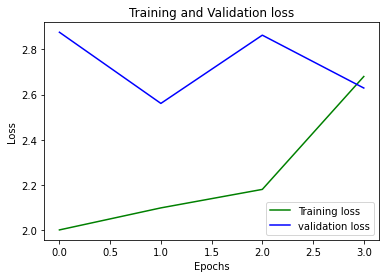

Model: 2


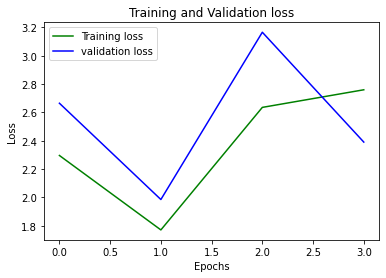

Model: 3


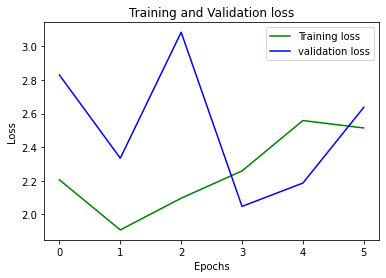

Model: 4


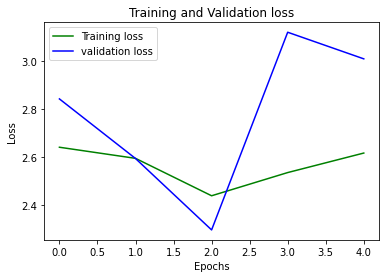

Model: 5


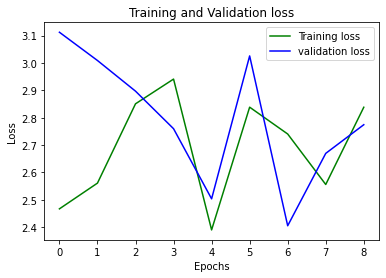

Model: 6


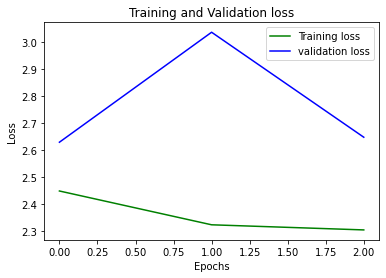

Model: 7


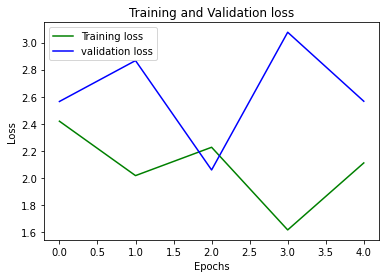

Model: 8


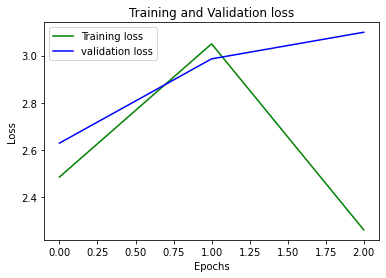

Model: 9


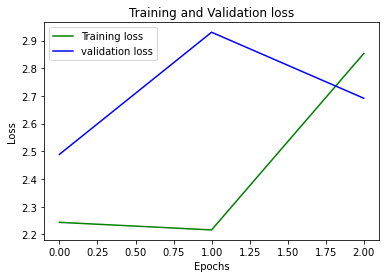

Model: 10


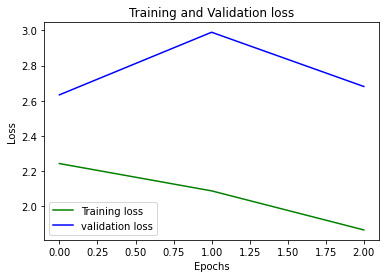

Model: 11


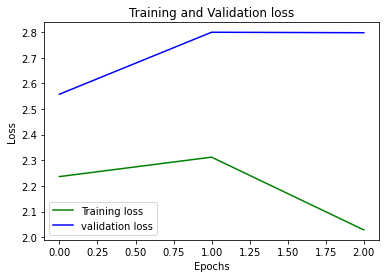

Model: 12


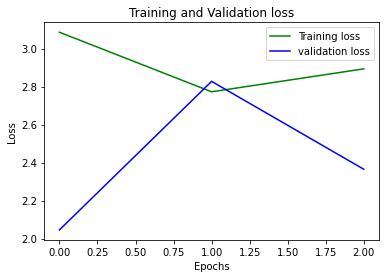

Model: 13


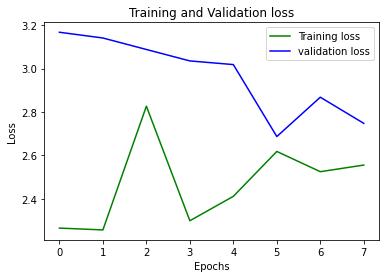

Model: 14


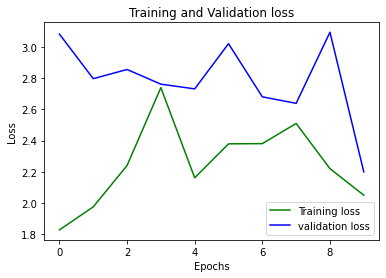

Model: 15


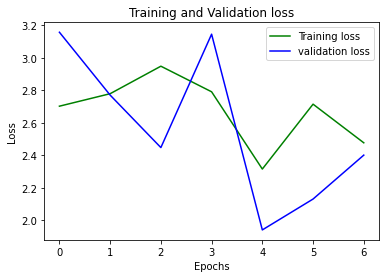

Model: 16


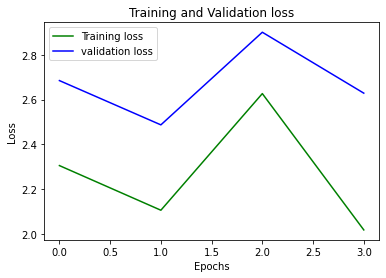

Model: 17


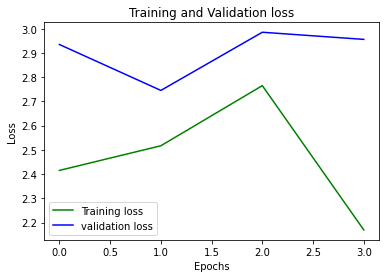

Model: 18


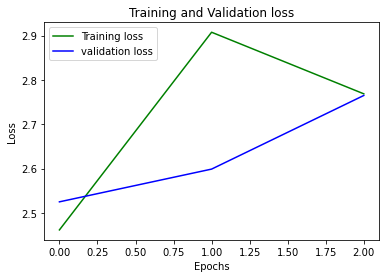

Model: 19


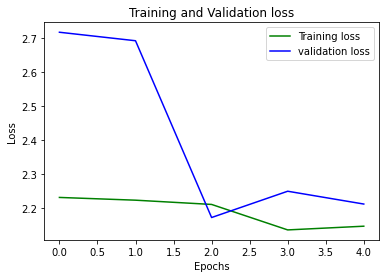

Model: 20


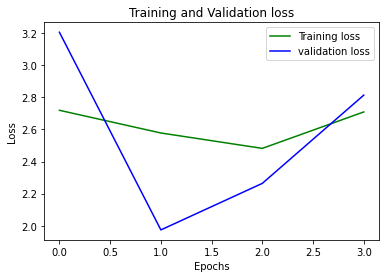

Model: 21


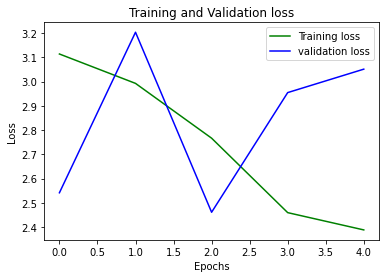

Model: 22


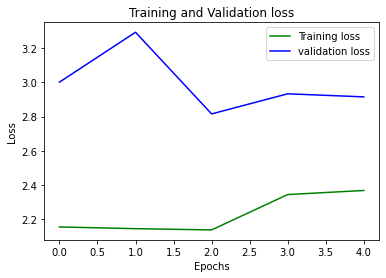

Model: 23


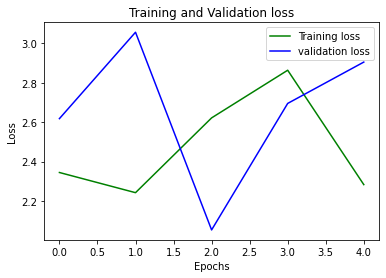

Model: 24


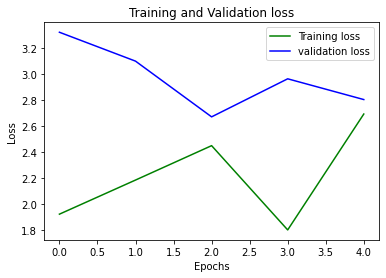

Model: 25


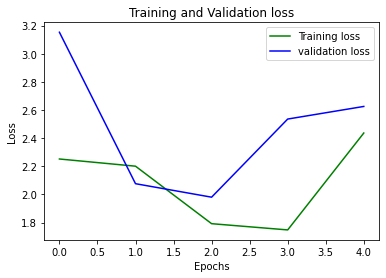

Model: 26


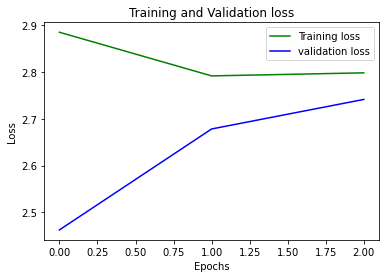

Model: 27


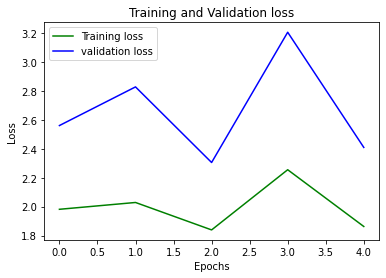

Model: 28


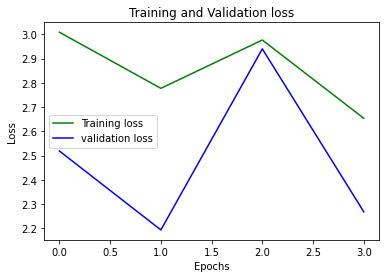

Model: 29


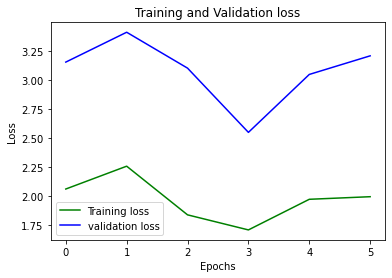

Model: 30


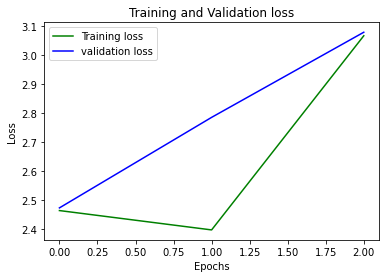

Model: 31


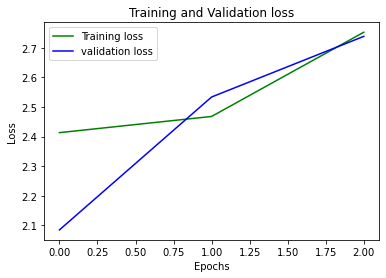

Model: 32


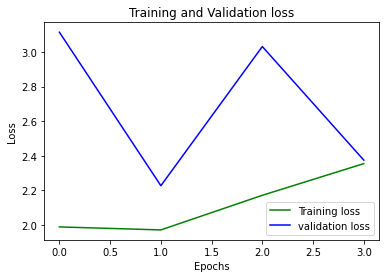

Model: 33


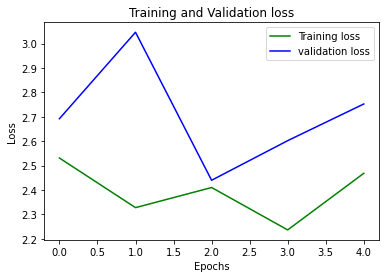

Model: 34


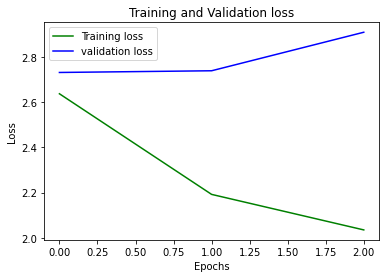

Model: 35


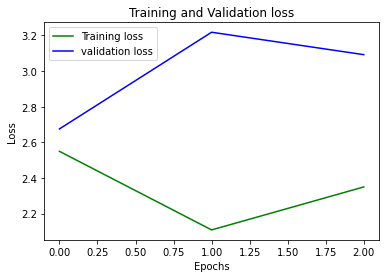

Model: 36


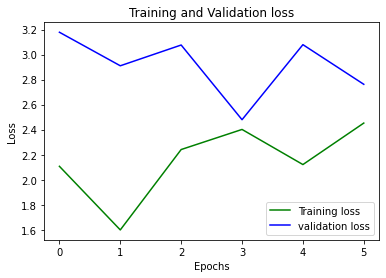

Model: 37


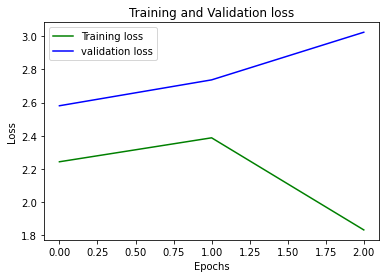

Model: 38


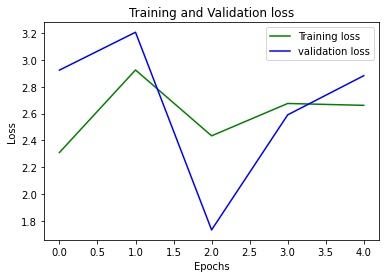

Model: 39


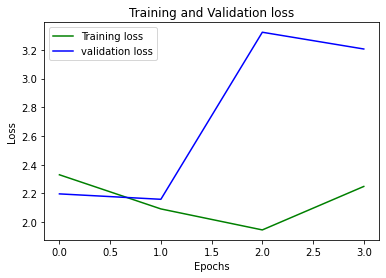

Model: 40


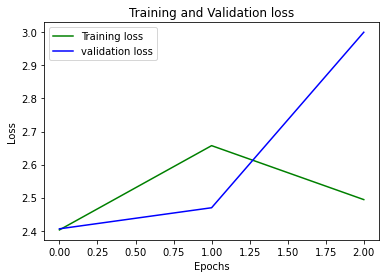

In [33]:
#Look at learning rates of each model
index = 0
for model in range(len(models)):
    index +=1
    print('Model:',index)

    loss_train = models[model].history.history['loss']
    loss_val = models[model].history.history['val_loss']
    epochs = range(0,len(models[model].history.history['loss']))
    plt.plot(epochs, loss_train, 'g', label='Training loss')
    plt.plot(epochs, loss_val, 'b', label='validation loss')
    plt.title('Training and Validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

In [34]:
#Model AUC will always be different will you evaluate it.
#So we evaluate each model multple times and get a distriution
AUC_all = []

for i in range(0,30):
    AUC = []
    for model in range(len(models)):
        AUC.append(models[model].evaluate(X_val, y_val, verbose=0)[1])
    AUC_all.append(AUC)


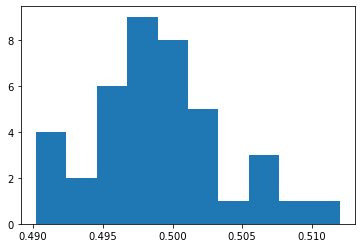

0.499239070514838


In [35]:
AUC_means=pd.DataFrame(AUC_all).T.mean(axis=1)
plt.hist(AUC_means)
plt.show()
print(np.mean(AUC_means))

In [36]:
#get predictions from the family of models
preds = []
for ms in range(len(models)):
    preds.append(models[ms].predict(X_test))

<function matplotlib.pyplot.show(close=None, block=None)>

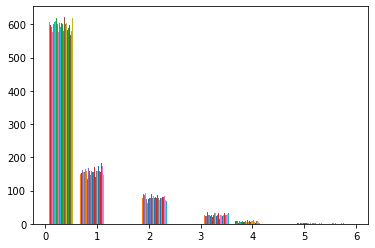

In [37]:
#Notice they come from the same distribtution 
plt.hist(preds)
plt.show

148.511


149

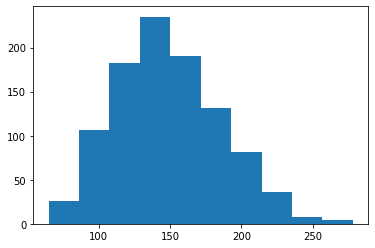

In [38]:
#Here we take a bootstraped distribution for the true points
#This is our theoretical distribtution 
samp = []
for r in range(1000):
    np.random.seed(r)
    samp.append(sum(np.random.choice(y_test, y_test.shape[0],replace=True)))
plt.hist(samp)
print(np.mean(samp)) #mean of the theoretical distribution 

#Here is what was observed 
sum(y_test)
#notice the average of the theoretical distribtuion is nearly the same as what was observed

166.122


165

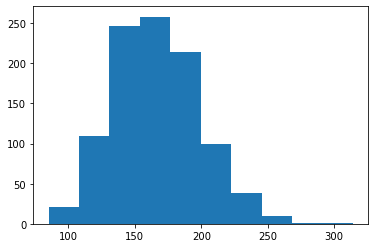

In [39]:
#We can also see the validation set theoretical distribtution 

samp = []
for r in range(1000):
    np.random.seed(r)
    samp.append(sum(np.random.choice(y_val, y_val.shape[0],replace=True)))
plt.hist(samp)
print(np.mean(samp)) #mean of the theoretical distribtuion

#Here is what was observed 
sum(y_val)

<function matplotlib.pyplot.hist(x, bins=None, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, *, data=None, **kwargs)>

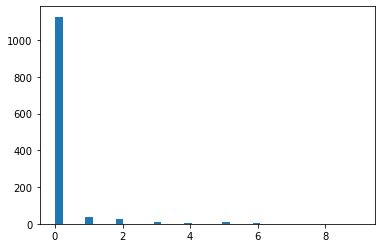

In [40]:
#Here is the distribution of the testing set
plt.hist(y_train,bins=40)
plt.hist

In [41]:
#Here we explude values above 1.5 since it has a very low probability of being observed
#We take the mean of each distribution
pops=[]
for p in range(len(preds)):
    pops.append(np.sum(preds[p][preds[p]<=1.5]))

[161.0, 149.0, 150.0, 154.0, 162.0, 167.0, 155.0, 157.0, 168.0, 164.0, 174.0, 158.0, 136.0, 157.0, 169.0, 160.0, 161.0, 147.0, 154.0, 158.0, 157.0, 159.0, 155.0, 172.0, 171.0, 140.0, 168.0, 158.0, 158.0, 182.0, 174.0, 173.0, 158.0, 157.0, 134.0, 183.0, 175.0, 140.0, 147.0, 162.0]
159.6


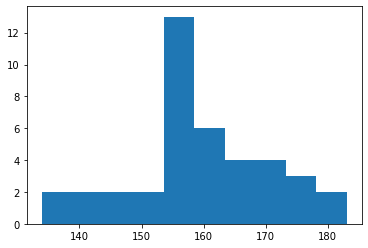

In [42]:
#Now we get the mean of the means
print(pops)
plt.hist(pops)
print(np.mean(pops))

Part 2: Putting the models together we find each location has a different probability distribution for counts. We will map the maximum value of each distribution back to the GPS coordinate to visualize the most we would expect to find in a certain area. (The maximum value has a very low probability of being observed, while observing a 0 count is highly probable.) We then place a marker for each location where Rhus.succedanea.L. was found and plot a circle around each point color coded to the true count. Grey points represent training and validation data. 

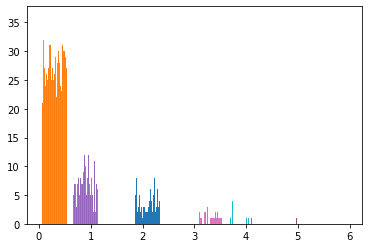

,0,1,2,3,4,5,6,7,8,9,...,860,861,862,863,864,865,866,867,868,869
0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,...,3.0,3.0,0.0,0.0,2.0,0.0,1.0,0.0,3.0,0.0
1,2.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0
4,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,2.0
5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,1.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,...,0.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0
8,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,3.0,0.0
9,0.0,0.0,1.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0


In [43]:
#get predicted values from each model and take the average
p_=pd.DataFrame(preds)
plt.hist(p_)
plt.show()
p_

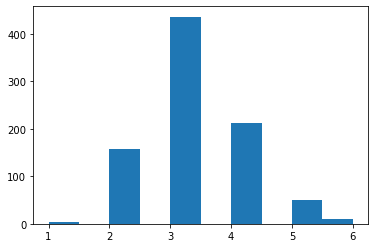

In [44]:
#Distribtution of max values
p_max=p_.T.max(axis=1)
p_max=np.array(p_max)
plt.hist(p_max)
plt.show()

In [45]:
#Get locations of points with counts above 0
y_test_locs=pd.concat([fc.iloc[:,2546:2548], y_test[y_test>0]], axis=1)
y_test_locs.dropna(inplace=True)
y_test_locs

,Longitude,Latitude,Rhus.succedanea.L.
47,120.614891451252,24.0519941988743,2.0
82,120.671389644879,22.9383758902111,1.0
181,120.718374669193,22.5784931867986,1.0
292,120.742551628174,23.5225399634364,2.0
582,120.837516863043,23.9632527071209,18.0
650,120.880024300576,23.5887706935185,2.0
681,120.89409650373,22.6525619129348,4.0
743,120.91832069392,22.6593133039042,1.0
858,120.989595805413,24.0658599790226,5.0
876,120.99550206439,24.1767417304316,1.0


In [46]:
#Get all GPS points of testing set 
p_data=pd.concat([fc.iloc[:,2546:2548], y_test], axis=1)
p_data.dropna(inplace=True)
p_data

,Longitude,Latitude,Rhus.succedanea.L.
3,120.259978942297,22.649859062465,0.0
4,120.261032907815,22.6583526860838,0.0
6,120.262532224147,22.6509003190337,0.0
10,120.266258394462,22.621631106123,0.0
13,120.267859944736,22.636981469764,0.0
...,...,...,...
2890,121.883720739878,24.9376877933551,0.0
2895,121.908068880291,24.960823880146,0.0
2896,121.945796238284,24.9876719070153,0.0
2897,121.948852718017,24.9871288482314,0.0


In [47]:
#get color map for predictions
colormap = cm.LinearColormap(colors=['gold','green','blue'], index=[0,np.max(p_max)/2,np.max(p_max)],vmin=0,vmax=np.max(p_max))
colormap


In [48]:
#color map of true values
colormap2 = cm.LinearColormap(colors=['gold','green','blue','purple'], index=[0,np.max(p_max)/2,np.max(p_max),np.max(y_test)],vmin=0,vmax=np.max(y_test))
colormap2

In [49]:

mp2 = folium.Map([24.62179, 121.391991], tiles='CartoDb dark_matter')

locs = zip(fc.Latitude, fc.Longitude)

p_locs_max = zip(p_data.Latitude, p_data.Longitude , p_max)



y_t_locs =zip(y_test_locs.Latitude,y_test_locs.Longitude,y_test_locs['Rhus.succedanea.L.'])

for location in locs:
    folium.CircleMarker(location=location, 
        color='grey',   radius=1).add_to(mp2)

    
for location in y_t_locs:
    #icon=folium.Icon(color=colormap(location[2]))
    folium.Marker(location=location[0:2]).add_to(mp2)
    folium.CircleMarker(location=location[0:2],color=colormap2(location[2]), radius=5).add_to(mp2)
    
for location in p_locs_max:
    folium.CircleMarker(location=location[0:2],color=colormap(location[2]), radius=2).add_to(mp2)
    
    

    
mp2.save('map2.html')

mp2